# Extract the spectrum of CTIO Data in November 2016
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : December 15th 2016

The goal is to extract the spectrum after the rotation

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [2]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [3]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [4]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [5]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [6]:
%load_ext Cython

In [7]:
from IPython.display import Image, display

In [8]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [9]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [10]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [11]:
inputdir="./rotated_fitsimages"
object_name='HD14943'

In [12]:
outputdir="./spectrum_fitsspec"

In [13]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [14]:
input_filelist=os.listdir(inputdir) 

In [15]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [16]:
#print input_filelist

In [17]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [18]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    index=0

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                index=index+1
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

In [19]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [20]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [21]:
print indexes_files

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117]


In [22]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [23]:
sorted_numbers=indexes_files[sorted_indexes]

In [24]:
print sorted_indexes

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]


In [25]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [26]:
#sorted_files

## Build full filename
----------------------------

In [27]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [28]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [29]:
print sorted_filenames.shape

(117,)


## Acces to data of  images
----------------------------------

In [30]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []

In [31]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo

In [32]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [33]:
len(all_images)

117

In [34]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowImages(all_images,all_titles,object_name):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        xprofile=np.sum(all_images[index],axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(all_images[index],vmin=-10,vmax=50)
        axarr[iy,ix].set_title(all_titles[index])
    title='Images of '.format(object_name)
    plt.suptitle(title,size=16)
    return thex0

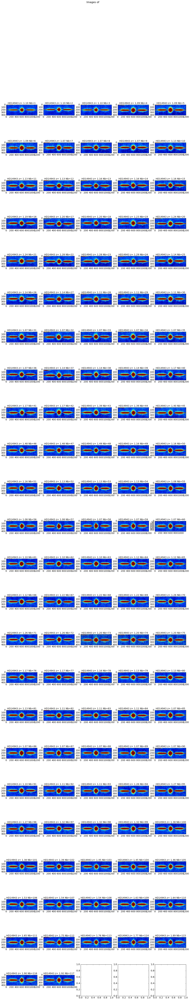

In [35]:
thex0=ShowImages(all_images,all_titles,object_name)

In [101]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowOneOrder(all_images,all_titles,object_name,all_expo):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,30))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        full_image=np.copy(all_images[index])
        reduc_image=full_image[170:230,600:1200]/all_expo[index]
        
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=1100)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Images of '.format(object_name)
    plt.suptitle(title,size=16)

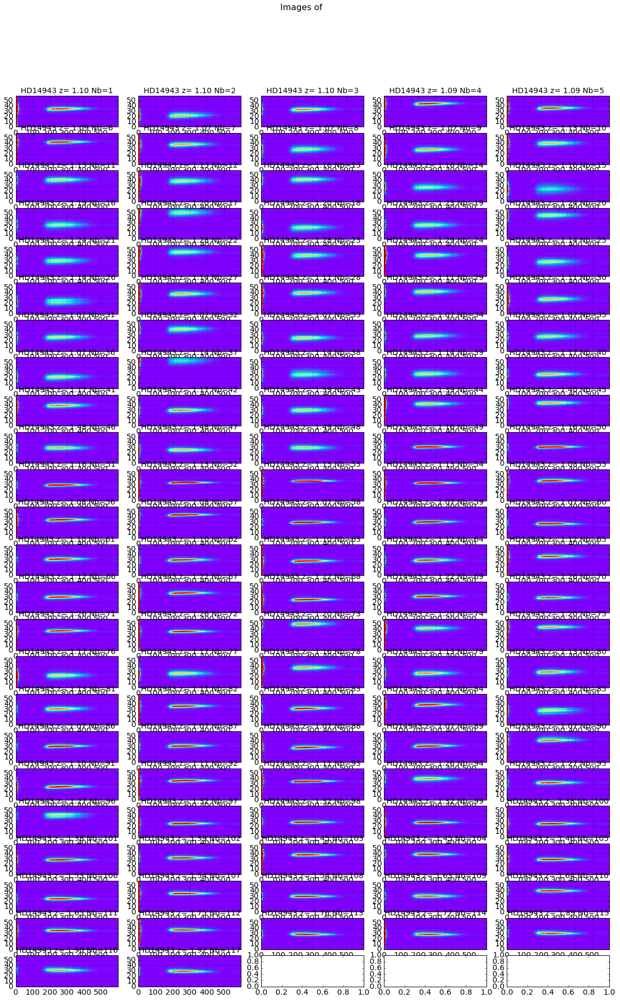

In [102]:
ShowOneOrder(all_images,all_titles,object_name,all_expo)

### Shows the transverse profile

In [38]:
DeltaX=600
w=20
ws=70

In [39]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowTransverseProfile(all_images,all_titles,object_name,all_expo):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    """

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    DeltaX=600
    w=20
    ws=80
    thespectra= []
    they0= []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        data=np.copy(all_images[index])
        data[:,DeltaX-ws:DeltaX+ws]=0
        yprofile=np.sum(data,axis=1)/all_expo[index]
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)
        thespectra.append(xprofile/(2.*float(w))/all_expo[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    return thespectra,they0

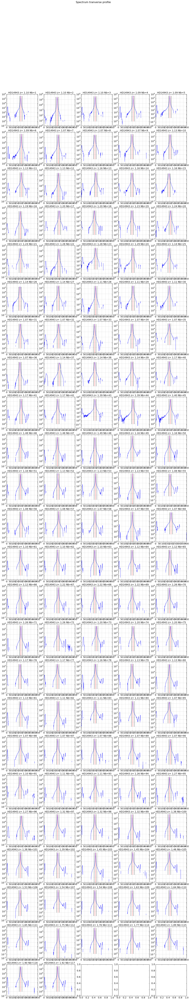

In [40]:
thespectra,they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo)

In [98]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowRightOrder(all_images,thex0,they0,all_titles,object_name,all_expo):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(25,60))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        full_image=np.copy(all_images[index])
        x_0=700
        y_0=they0[index]
        reduc_image=full_image[y_0-10:y_0+10,600:1200]/all_expo[index]
        
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=1100)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Right part of spectrum of '.format(object_name)
    plt.suptitle(title,size=16)

In [97]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowLeftOrder(all_images,thex0,they0,all_titles,object_name,all_expo):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(25,60))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        full_image=np.copy(all_images[index])
        x_0=700
        y_0=they0[index]
        reduc_image=full_image[y_0-10:y_0+10,0:600]/all_expo[index]
        
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=1100)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Left part of spectrum of '.format(object_name)
    plt.suptitle(title,size=16)

In [42]:
print len(thex0)

117


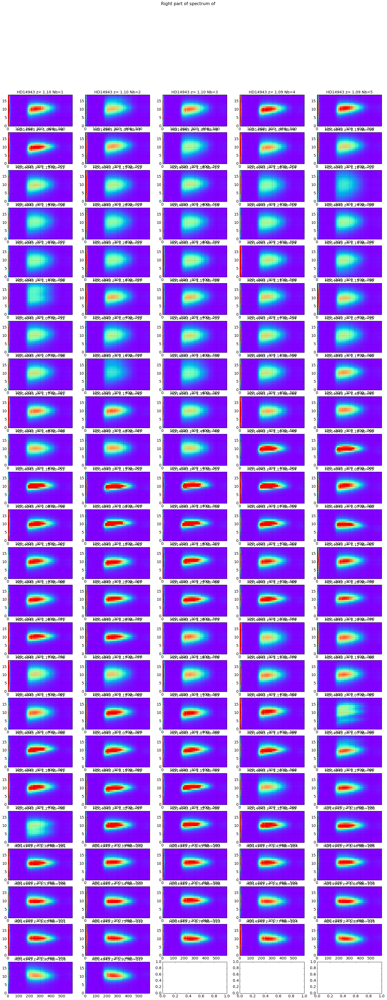

In [99]:
ShowRightOrder(all_images,thex0,they0,all_titles,object_name,all_expo)

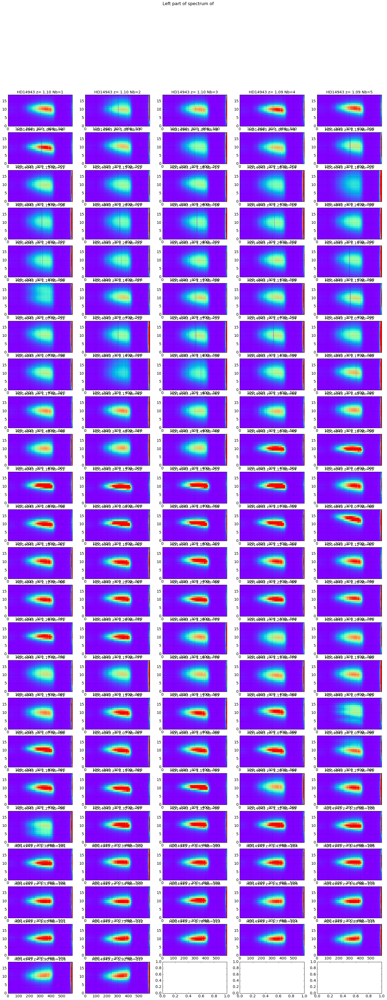

In [100]:
ShowLeftOrder(all_images,thex0,they0,all_titles,object_name,all_expo)

In [44]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowSpectrumProfile(spectra,all_titles,object_name):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5
        axarr[iy,ix].plot(spectra[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    title='Spectrum 1D profile '.format(object_name)
    plt.suptitle(title,size=16)

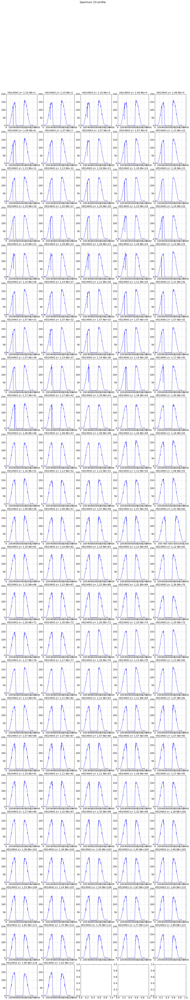

In [45]:
ShowSpectrumProfile(thespectra,all_titles,object_name)

## Example of a single spectrum

In [46]:
sel=68
spectrum_sel=thespectra[sel]

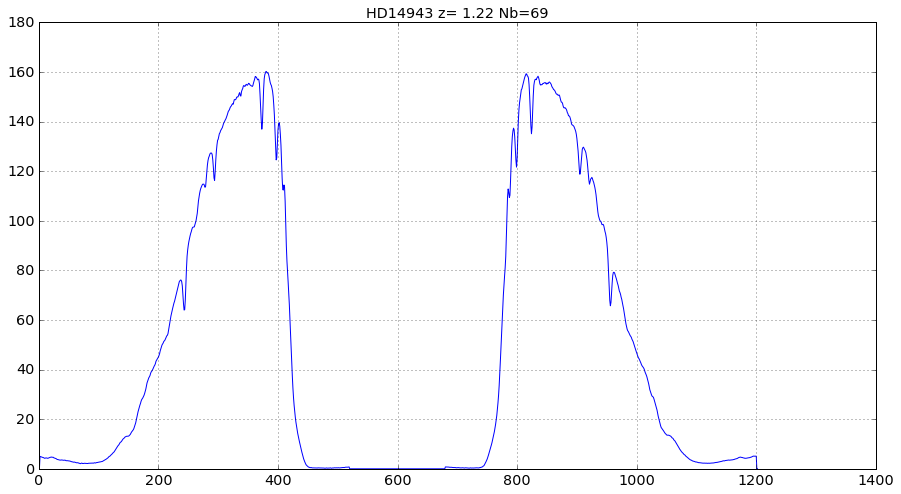

In [47]:
plt.figure(figsize=(15,8))
plt.plot(spectrum_sel)
title=all_titles[sel]
plt.title(title)
plt.grid(True)

## Cut the spectrum into two left/right part

In [48]:
xmin_center=450
xmax_center=750
skybg=1

In [49]:
def GetSpectrumBackground(inspectra,start,stop,skybg):
    '''
    Return the background    
    '''
    cropedbg=inspectra[start:stop]
    purebg=cropedbg[np.where(cropedbg!=skybg)]  # remove region of the bing star
    
    return purebg

In [50]:
def SeparateSpectra(inspectra,x0):
    '''
    Cut the two spectra
    '''
    rightspectra=inspectra[x0:]
    revleftspectra=inspectra[:x0]
    leftspectra=   revleftspectra[::-1]
    #rightspectra=rightspectra[np.where(rightspectra>0)]
    #leftspectra=leftspectra[np.where(leftspectra>0)]
    
    return leftspectra,rightspectra

In [51]:
def DiffSpectra(spec1,spec2,bg):
    '''
    Make the difference of the tow spectra 
    
    '''
    N1=spec1.shape[0]
    N2=spec2.shape[0]
    N=np.min([N1,N2])
    spec1_croped=spec1[0:N]
    spec2_croped=spec2[0:N]
    diff_spec=np.average((spec1_croped-spec2_croped)**2)/bg**2
    return diff_spec  

In [52]:
def FindCenter(fullspectrum,xmin,xmax,specbg):
    '''
    '''   
    all_x0=np.arange(xmin,xmax,1)
    NBPOINTS=np.shape(all_x0)
    chi2=np.zeros(NBPOINTS)
    for idx,x0 in np.ndenumerate(all_x0):
        spec1,spec2=SeparateSpectra(fullspectrum,x0)
        chi2[idx]=DiffSpectra(spec1,spec2,specbg)
    return all_x0,chi2

In [53]:
all_candidate_center,all_chi2=FindCenter(spectrum_sel,xmin_center,xmax_center,1)

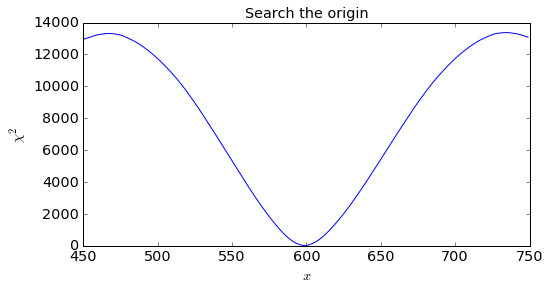

In [54]:
fig = plt.figure(figsize=(8,4))
plt.plot(all_candidate_center,all_chi2)
plt.title('Search the origin')
plt.ylabel('$\chi^2$')
plt.xlabel('$x$')
#plt.ylim(0,200.)

In [55]:
# find where is the minimum of chi2
indexmin=np.where(all_chi2==all_chi2.min())[0]
theorigin=all_candidate_center[indexmin]
print indexmin[0],theorigin[0],all_chi2.min()

149 599 9.59367987389


In [56]:
spec1,spec2=SeparateSpectra(spectrum_sel,theorigin[0])

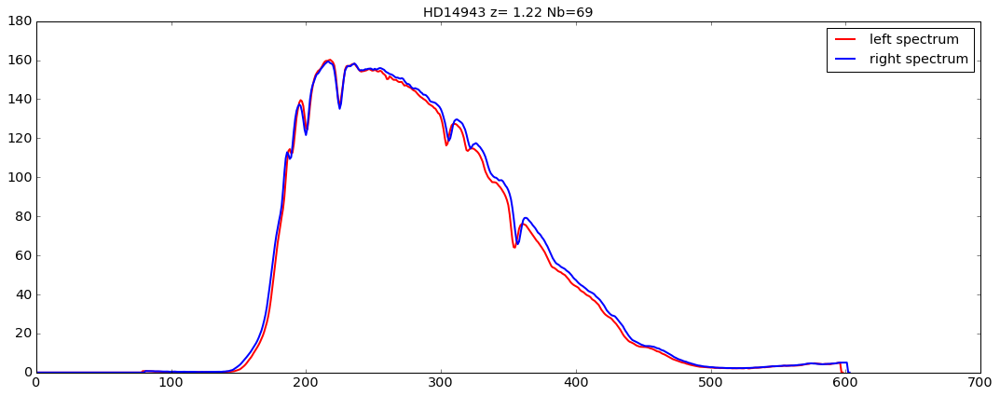

In [57]:
fig, ax = plt.subplots(figsize=(15, 6))
ax.plot(spec1,'r-',lw=2,label='left spectrum')
ax.plot(spec2,'b-',lw=2,label='right spectrum')
plt.title(title)
plt.tight_layout()
plt.legend(loc='best')

## Split Spectrum into two parts
----------------------------------------------

In [103]:
def SplitSpectrumProfile(spectra,all_titles,object_name):
    """
    SplitSpectrumProfile: Split the spectrum in two parts
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    skybg=1
    spectra_left=[]
    spectra_right=[]
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5

        spectrum_sel=spectra[index]    
        all_candidate_center,all_chi2=FindCenter(spectrum_sel,xmin_center,xmax_center,skybg)
        
        indexmin=np.where(all_chi2==all_chi2.min())[0]
        theorigin=all_candidate_center[indexmin]
        
        spec1,spec2=SeparateSpectra(spectrum_sel,theorigin[0])
        
        spectra_left.append(spec1)
        spectra_right.append(spec2)
        
        axarr[iy,ix].plot(spec1,'r-',lw=1,label='left')
        axarr[iy,ix].plot(spec2,'b-',lw=1,label='right')
        axarr[iy,ix].legend(loc='best')                  
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    
    title='Two 1D Spectra 1D for '.format(object_name)
    plt.suptitle(title,size=16)
    
    return spectra_left,spectra_right

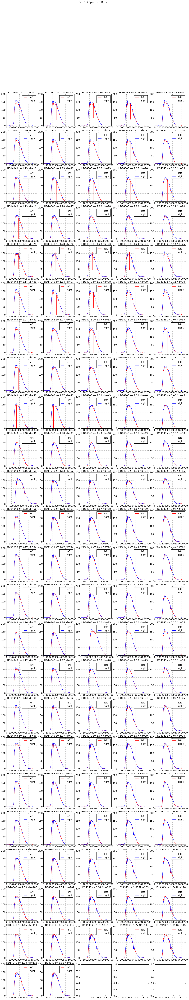

In [104]:
spectra_left,spectra_right=SplitSpectrumProfile(thespectra,all_titles,object_name)

In [60]:
def SupressDeadPixel(spectra,imin,imax,frac,all_titles,object_name):
    """
    SupressDeadPixel:
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    skybg=1
    spectra_list=[]
   
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5

        spectrum_sel=np.copy(spectra[index])    
        
        for ipix in np.arange(imin,imax):
            thecurrent=spectrum_sel[ipix]
            theprevious=spectrum_sel[ipix-1]
            thenext=spectrum_sel[ipix+1]
            theav=np.mean(np.array([theprevious,thenext]))
            theratio=np.abs(thecurrent-theav)/theav
            if theratio > frac:
                spectrum_sel[ipix]=theav
                
            
        spectra_list.append(spectrum_sel)
        
        axarr[iy,ix].plot(spectrum_sel,'r-',lw=2)
        
        #axarr[iy,ix].legend(loc='best')                  
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    
    title=' Supress dead pixels for '.format(object_name)
    plt.suptitle(title,size=16)
    
    return spectra_list

/Users/dagoret-campagnesylvie/.local/lib/python2.7/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


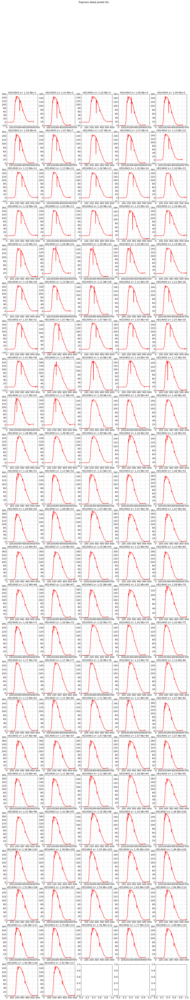

In [61]:
new_left_spectra=SupressDeadPixel(spectra_left,150,500,0.5,all_titles,object_name)

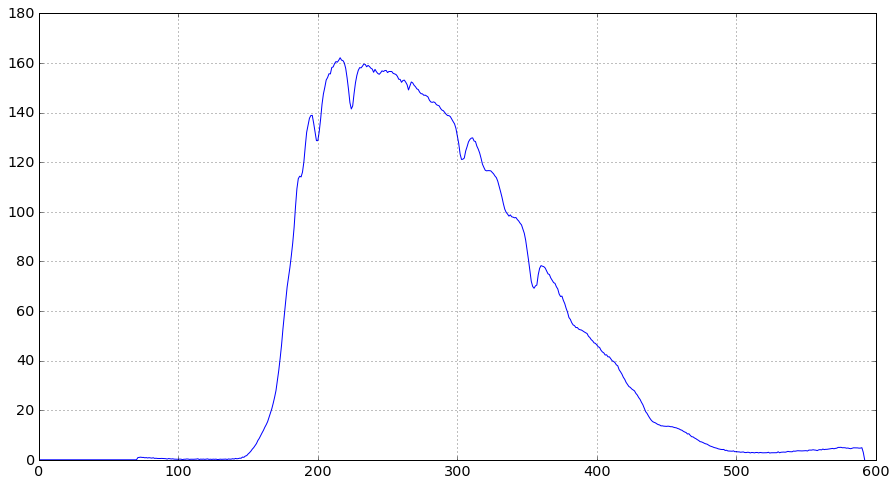

In [107]:
plt.figure(figsize=(15,8))
plt.plot(spectra_right[0])
plt.grid(True)

## Gain Calibration

In [63]:
gains=np.linspace(0.5,1.5,1000)
NBGAINS=gains.shape[0]
chi2New=np.zeros(NBGAINS)

In [64]:
def DiffAmplitudes(sp1,sp2,gain,basebg):
    '''
    get the differences of the spectra for that gain
    '''    
    return DiffSpectra(gain*sp1,sp2,basebg)

In [65]:
thegain=gains[np.where(chi2New==chi2New.min())]
print thegain

[ 0.5         0.501001    0.502002    0.503003    0.504004    0.50500501
  0.50600601  0.50700701  0.50800801  0.50900901  0.51001001  0.51101101
  0.51201201  0.51301301  0.51401401  0.51501502  0.51601602  0.51701702
  0.51801802  0.51901902  0.52002002  0.52102102  0.52202202  0.52302302
  0.52402402  0.52502503  0.52602603  0.52702703  0.52802803  0.52902903
  0.53003003  0.53103103  0.53203203  0.53303303  0.53403403  0.53503504
  0.53603604  0.53703704  0.53803804  0.53903904  0.54004004  0.54104104
  0.54204204  0.54304304  0.54404404  0.54504505  0.54604605  0.54704705
  0.54804805  0.54904905  0.55005005  0.55105105  0.55205205  0.55305305
  0.55405405  0.55505506  0.55605606  0.55705706  0.55805806  0.55905906
  0.56006006  0.56106106  0.56206206  0.56306306  0.56406406  0.56506507
  0.56606607  0.56706707  0.56806807  0.56906907  0.57007007  0.57107107
  0.57207207  0.57307307  0.57407407  0.57507508  0.57607608  0.57707708
  0.57807808  0.57907908  0.58008008  0.58108108  0

### prepare outputfilename

In [66]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [67]:
newfullfilenames

['./spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_45_51_1.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_46_55_2.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_47_58_3.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_52_42_4.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_54_05_5.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_55_29_6.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T02_27_22_7.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T02_28_46_8.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T02_30_09_9.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_36_28_10.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_37_52_11.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_39_16_12.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_55_21_13.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_56_

### Save outputfilename

In [68]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=spectra_right[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)

In [69]:
!ls

Extract_Spectrum_HD14943.ipynb ViewAllImages_HD1494_v0.ipynb
FindCentralStar_HD14943.ipynb  cut_fitsimages
FindOptRot_HD14943.ipynb       logbk_HD14943_ctioNov2016.fits
MakeLogBook.ipynb              logbk_mucol_ctioNov2016.fits
README.md                      processed_fitsimages
README.md~                     rotated_fitsimages
Test_cython.ipynb              spectrum_fitsimages
ViewAllImages_HD14943.ipynb    spectrum_fitsspec


In [70]:
# !ls -l cut_fitsimages